## Time Series Clustering using K-Means based on SAX & TF-IDF Vectorization

Final Project

- Ailaiah Srinivas Katakam
- Jonathan McNutt

In [1]:
import pandas as pd
import numpy as np
from importlib import reload
import os

import pysax
# copy the attached pysax.py to your current directory
# you will need joblib too. -> pip install joblib

import matplotlib.pyplot as plt
import plotly
import plotly.graph_objs as go
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import MDS

%matplotlib inline 

### Step 1: Loading Pre-processed Data & Initial Exploration

In [2]:
# initial exploration of the stock data
df_apple = pd.read_csv('./Data/Stocks/aapl.us.txt', sep=',')
df_google = pd.read_csv('./Data/Stocks/googl.us.txt', sep=',')

In [3]:
df_apple.head()

,Date,Open,High,Low,Close,Volume,OpenInt
0,1984-09-07,0.42388,0.42902,0.41874,0.42388,23220030,0
1,1984-09-10,0.42388,0.42516,0.41366,0.42134,18022532,0
2,1984-09-11,0.42516,0.43668,0.42516,0.42902,42498199,0
3,1984-09-12,0.42902,0.43157,0.41618,0.41618,37125801,0
4,1984-09-13,0.43927,0.44052,0.43927,0.43927,57822062,0


In [4]:
df_google.head()

,Date,Open,High,Low,Close,Volume,OpenInt
0,2004-08-19,50.000,52.03,47.980,50.170,44703800,0
1,2004-08-20,50.505,54.54,50.250,54.155,22857200,0
2,2004-08-23,55.375,56.74,54.525,54.700,18274400,0
3,2004-08-24,55.620,55.80,51.785,52.435,15262600,0
4,2004-08-25,52.480,54.00,51.940,53.000,9197800,0


In [5]:
# getting partial data 
df_apple_ss = df_apple.loc[df_apple.Date > '2003-01-01']
df_google_ss = df_google.loc[df_google.Date > '2003-01-01']

In [6]:
# visualize the time series of Closed prices of Apple stock
data = [go.Scatter(x=df_apple_ss.Date, y=df_apple_ss.Close, line = dict(color = '#17BECF'))]
plotly.offline.iplot(data)

In [7]:
# visualize the time series of Closed prices of Google stock
data = [go.Scatter(x=df_google_ss.Date, y=df_google_ss.Close, line = dict(color = '#FF00FF'))]
plotly.offline.iplot(data)

In [8]:
# create the tickers list
tickers=[]
for filename in os.listdir('./Data/Stocks'):
    tickers.append(filename.split('.')[0])

In [9]:
len(tickers)

7195

In [10]:
# load the stock data from pre-processing notebook
df_stocks = pd.read_csv('stocks_clean.csv', index_col=0)

In [11]:
df_stocks.shape

(1305, 6399)

In [12]:
df_stocks.head()

,a,aa,aaap,aaba,aac,aal,aamc,aame,aan,aaoi,...,znga,znh,zoes,zsan,zto,ztr,zts,zumz,zx,zyne
2012-01-02,24.625,19.402,24.5,16.28,18.5,24.064,15.0,1.8961,26.177,9.96,...,9.45,23.030,24.72,11.01,16.57,7.0767,29.862,26.46,3.0665,16.25
2012-01-03,24.625,19.402,24.5,16.28,18.5,24.064,15.0,1.8961,26.177,9.96,...,9.45,23.030,24.72,11.01,16.57,7.0767,29.862,26.46,3.0665,16.25
2012-01-04,24.428,19.864,24.5,15.78,18.5,24.064,15.0,1.8865,26.216,9.96,...,9.19,22.534,24.72,11.01,16.57,7.0531,29.862,26.33,3.0271,16.25
2012-01-05,24.974,19.676,24.5,15.64,18.5,24.064,15.0,1.9539,26.128,9.96,...,8.91,22.157,24.72,11.01,16.57,7.0767,29.862,30.95,3.1257,16.25
2012-01-06,25.246,19.255,24.5,15.52,18.5,24.064,15.0,1.9058,25.658,9.96,...,8.81,22.276,24.72,11.01,16.57,7.1006,29.862,31.27,3.0172,16.25


### Step 2: Normalize the time series

In [13]:
# https://github.com/dolaameng/pysax
# above library was created for Python 2.x, we have fixed it to work with Python 3.6.

# normalizing the tickers
sax = pysax.SAXModel() 
df_stocks_norm = pd.DataFrame(index=df_stocks.index)
for ticker in df_stocks.columns:
    df_stocks_norm[ticker] = sax.whiten(df_stocks[ticker])

In [14]:
# visualize the normalised time series of Closed prices of Apple stock
data = [go.Scatter(x=df_stocks_norm.index, y=df_stocks_norm['aapl'], line = dict(color = '#17BECF'))]
plotly.offline.iplot(data)

In [15]:
# visualize the normalised time series of Closed prices of Google stock
data = [go.Scatter(x=df_stocks_norm.index, y=df_stocks_norm['googl'], line = dict(color = '#FF00FF'))]
plotly.offline.iplot(data)

In [16]:
df_stocks_norm.head()

,a,aa,aaap,aaba,aac,aal,aamc,aame,aan,aaoi,...,znga,znh,zoes,zsan,zto,ztr,zts,zumz,zx,zyne
2012-01-02,-1.825372,-0.673000,-0.453519,-1.527862,-0.395021,-1.063626,-0.753151,-2.827034,-0.519805,-0.894151,...,2.457084,-0.236891,-0.771904,0.652415,0.162928,-2.043224,-0.925048,0.017548,0.951360,0.331803
2012-01-03,-1.825372,-0.673000,-0.453519,-1.527862,-0.395021,-1.063626,-0.753151,-2.827034,-0.519805,-0.894151,...,2.457084,-0.236891,-0.771904,0.652415,0.162928,-2.043224,-0.925048,0.017548,0.951360,0.331803
2012-01-04,-1.857101,-0.595558,-0.453519,-1.576581,-0.395021,-1.063626,-0.753151,-2.843074,-0.509638,-0.894151,...,2.346550,-0.291633,-0.771904,0.652415,0.162928,-2.067441,-0.925048,-0.001105,0.912700,0.331803
2012-01-05,-1.769162,-0.627071,-0.453519,-1.590223,-0.395021,-1.063626,-0.753151,-2.730459,-0.532579,-0.894151,...,2.227513,-0.333242,-0.771904,0.652415,0.162928,-2.043224,-0.925048,0.661819,1.009449,0.331803
2012-01-06,-1.725353,-0.697640,-0.453519,-1.601915,-0.395021,-1.063626,-0.753151,-2.810826,-0.655103,-0.894151,...,2.185000,-0.320108,-0.771904,0.652415,0.162928,-2.018699,-0.925048,0.707735,0.902986,0.331803


### Step 3: Generate SAX Symbols from normalized time series

In [32]:
# reference to SAX algorithm: http://www.cs.ucr.edu/~eamonn/SAX.htm

# generate the list of sax symbols for each ticker
sax = pysax.SAXModel(window=65, stride = 65, nbins = 10, alphabet="ABCDE")
df_stocks_sax_symb=pd.DataFrame()
for ticker in df_stocks.columns:
    df_stocks_sax_symb[ticker] = sax.symbolize_signal(df_stocks_norm[ticker])

In [33]:
# transpose the dataframe to make tickers as rows
df_stocks_sax_symb = df_stocks_sax_symb.T

In [34]:
df_stocks_sax_symb.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
a,AACDDCDDED,EEDDBBCABA,DBACEBBBDD,DCAABACDEE,ACEEECACBA,ACBACEEEDB,ABBBBCCDEE,BABBACCDEE,BEECDBBCBA,CABACBDEEE,EBBBADDDED,CAABDDEEBD,CBAABCEEDD,CEEDDDDAAA,DDEEECAAAA,AAABCCEEEE,EDBBAABDCE,AABBBCEEEE,ABDDDEDDBB,EECABDBADD
aa,AADDEDDBDC,EEEECAAABA,CAABCCBDED,EEECBAABDC,DDEDDEAAAA,CBBDEEDCBA,ACCBCCBBEE,AABDCCDDDE,AADDBCDEDE,AACCCBCDEE,ABDDCCDEDB,BABDDEEEAB,DDDDEDCBAA,CDDEEDBBAA,EEDCCBABCB,DECBBACCBD,EBAABBCEEE,BBEEDABBBC,ABEEDDCCBA,ABAABEEDED
aaap,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,BBBBBBCDEE,CBAAABDEEE,EEEDDAABBA,ABABBCDDEE,EEEDDDCAAA
aaba,EDDDEAAABC,BADDCCBCDE,DDDECAAADD,AAABCDDEEE,AABABCCEEE,AAABEEDEDB,ABCCCBBCEE,BBAAACDEEE,EEDABCBDCA,DBDEBBCDDA,BAABBCDEEE,AAABDEEDDD,EEDDBBBABB,DEECCDCBAA,EEEDDCBAAA,ABBEDCCECD,DCBBAACDEE,ABCCCDCDDD,AAABBDDEEE,EEDDBBCBCA
aac,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,CCCCCCCCCC,AAABCDDEEE,DCCABCECBC,AABBACDEEE,EEEDABBBBB,CEECCBCBBA,CBABCEECAC,AABCDCDECB,EEEEBAACBA,EEEEBBBBAA


### Step 4: Generate SAX Bag of Words for each time series

In [35]:
# generate sax bag of words representation for each ticker
df_stocks_sax_bow=pd.DataFrame()
stocks_sax_bow = [' '.join(row) for row in df_stocks_sax_symb[df_stocks_sax_symb.columns[0:]].values]
df_stocks_sax_bow['sax_bow'] = [' '.join(row) for row in df_stocks_sax_symb[df_stocks_sax_symb.columns[0:]].values]

In [36]:
df_stocks_sax_bow.index = df_stocks_sax_symb.index

In [37]:
df_stocks_sax_bow.shape

(6399, 1)

In [38]:
# ticker with sax bag of words
df_stocks_sax_bow.head()

,sax_bow
a,AACDDCDDED EEDDBBCABA DBACEBBBDD DCAABACDEE AC...
aa,AADDEDDBDC EEEECAAABA CAABCCBDED EEECBAABDC DD...
aaap,CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CC...
aaba,EDDDEAAABC BADDCCBCDE DDDECAAADD AAABCDDEEE AA...
aac,CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CC...


In [39]:
# lets take one stock and check if it generated the correct Bag of word representation
df_stocks_sax_bow.loc['aapl']

sax_bow    AAABCCDDEE EECCBABBCC AAAABDDDEE EEEDBBCBAA EE...
Name: aapl, dtype: object

In [40]:
# verify the symbolize_signal returns the exact same Bag of words for Apple stock as above
print (sax.symbolize_signal(df_stocks_norm['aapl']))

['AAABCCDDEE', 'EECCBABBCC', 'AAAABDDDEE', 'EEEDBBCBAA', 'EEDBCBBABB', 'BBADEDEDCA', 'AAABCEEECD', 'AABCBCDEEE', 'EDEAADBCCD', 'AAACCCDEEE', 'AAABBDEDEE', 'AAABCEEECD', 'AAABCEEEDD', 'ABBDADEDCC', 'EEEDBBAABB', 'AABEECEDBA', 'EBBBAABDEE', 'EEEBAACCBB', 'AAABDDDDDE', 'CDEDAABADE']


In [41]:
# list of bag of sax words
stocks_sax_bow

['AACDDCDDED EEDDBBCABA DBACEBBBDD DCAABACDEE ACEEECACBA ACBACEEEDB ABBBBCCDEE BABBACCDEE BEECDBBCBA CABACBDEEE EBBBADDDED CAABDDEEBD CBAABCEEDD CEEDDDDAAA DDEEECAAAA AAABCCEEEE EDBBAABDCE AABBBCEEEE ABDDDEDDBB EECABDBADD',
 'AADDEDDBDC EEEECAAABA CAABCCBDED EEECBAABDC DDEDDEAAAA CBBDEEDCBA ACCBCCBBEE AABDCCDDDE AADDBCDEDE AACCCBCDEE ABDDCCDEDB BABDDEEEAB DDDDEDCBAA CDDEEDBBAA EEDCCBABCB DECBBACCBD EBAABBCEEE BBEEDABBBC ABEEDDCCBA ABAABEEDED',
 'CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC BBBBBBCDEE CBAAABDEEE EEEDDAABBA ABABBCDDEE EEEDDDCAAA',
 'EDDDEAAABC BADDCCBCDE DDDECAAADD AAABCDDEEE AABABCCEEE AAABEEDEDB ABCCCBBCEE BBAAACDEEE EEDABCBDCA DBDEBBCDDA BAABBCDEEE AAABDEEDDD EEDDBBBABB DEECCDCBAA EEEDDCBAAA ABBEDCCECD DCBBAACDEE ABCCCDCDDD AAABBDDEEE EEDDBBCBCA',
 'CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCC

In [42]:
len(stocks_sax_bow)

6399

### Step 5: Convert SAX Bag of Words into TF-IDF vectors

In [43]:
# converting SAX Bag of words to TF-IDF vectors
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(stocks_sax_bow)

In [44]:
tfidf_matrix.shape

(6399, 53140)

In [45]:
terms = vectorizer.get_feature_names()

In [46]:
len(terms)

53140

### Step 6: Clustering SAX TF-IDF vectors using K-Means

In [47]:
# performing k-means clustering based on K=15. When we did the elbow plot for optimal K, it was time consuming 
# and gave us a very high K value. To avoid plotting and interpretation of the results, we chose 15 as clusters.

num_clusters = 15

km = KMeans(n_clusters=num_clusters)

km.fit(tfidf_matrix)

clusters = km.labels_.tolist()

In [48]:
km.inertia_

5215.432833881206

In [58]:
len(clusters)

6399

In [59]:
# building ticker to clusters dataframe
stocks = { 'ticker': df_stocks.columns, 'cluster': clusters }

df_cluster = pd.DataFrame(stocks, index = [clusters] , columns = ['ticker', 'cluster'])

In [60]:
df_cluster.head()

,ticker,cluster
11,a,11
11,aa,11
1,aaap,1
6,aaba,6
1,aac,1


In [61]:
# cluster value counts
df_cluster['cluster'].value_counts()

11    2046
1     1349
2      732
9      351
6      236
3      227
8      206
14     199
4      193
12     187
10     184
7      167
5      143
13     135
0       44
Name: cluster, dtype: int64

### Step 7: Perform Multidimensional Scaling for visualizing the level of similarity

In [62]:
# cosine similarity is measured against the tf-idf matrix and can be used to generate a measure of similarity between each 
# ticker and the other tickers in the corpus. 
# subtracting it from 1 provides cosine distance which can be used for plotting on a euclidean (2-dimensional) plane.

dist = 1 - cosine_similarity(tfidf_matrix)

In [63]:
# distance matrix
dist

array([[ -2.22044605e-16,   1.00000000e+00,   1.00000000e+00, ...,
          1.00000000e+00,   1.00000000e+00,   1.00000000e+00],
       [  1.00000000e+00,   0.00000000e+00,   1.00000000e+00, ...,
          1.00000000e+00,   1.00000000e+00,   1.00000000e+00],
       [  1.00000000e+00,   1.00000000e+00,  -2.22044605e-16, ...,
          1.00000000e+00,   1.00000000e+00,   2.89680208e-01],
       ..., 
       [  1.00000000e+00,   1.00000000e+00,   1.00000000e+00, ...,
         -4.44089210e-16,   1.00000000e+00,   1.00000000e+00],
       [  1.00000000e+00,   1.00000000e+00,   1.00000000e+00, ...,
          1.00000000e+00,   0.00000000e+00,   1.00000000e+00],
       [  1.00000000e+00,   1.00000000e+00,   2.89680208e-01, ...,
          1.00000000e+00,   1.00000000e+00,   0.00000000e+00]])

In [64]:
# convert two components as we're plotting points in a two-dimensional plane
# "precomputed" because we provide a distance matrix
# we will also specify `random_state` so the plot is reproducible.
MDS()
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=1)

%time pos = mds.fit_transform(dist) 

xs, ys = pos[:, 0], pos[:, 1]

Wall time: 29min 27s


### Step 8: Visualizing ticker Clusers

#### On entire dataset

In [65]:
# set up 15 colors per clusters using a dict
cluster_colors = {0: '#808080', 1: '#000000', 2: '#FF0000', 3: '#800000', 4: '#FFFF00',
                  5: '#808000', 6: '#00FF00', 7: '#008000', 8: '#00FFFF', 9: '#008080',
                  10: '#0000FF', 11: '#000080', 12: '#FF00FF', 13: '#800080', 14: '#9999ff'}

# set up 15 cluster names using a dict
cluster_names = {0: 'Cluster0', 1: 'Cluster1', 2: 'Cluster2', 3: 'Cluster3', 4: 'Cluster4',
                 5: 'Cluster5', 6: 'Cluster6', 7: 'Cluster7', 8: 'Cluster8', 9: 'Cluster9',
                 10: 'Cluster0', 11: 'Cluster11', 12: 'Cluster12', 13: 'Cluster13', 14: 'Cluster14'}

In [66]:
# create data frame that has the result of the MDS plus the cluster numbers and tickers
df = pd.DataFrame(dict(x=xs, y=ys, label=clusters, ticker=df_stocks.columns)) 

In [67]:
df.shape

(6399, 4)

In [68]:
df.head()

,label,ticker,x,y
0,11,a,-0.220123,0.618895
1,11,aa,-0.566407,-0.548286
2,1,aaap,0.476064,-0.098183
3,6,aaba,-0.029775,-0.627588
4,1,aac,0.370390,-0.022156


In [69]:
df.groupby('label').count()

,ticker,x,y
label,,,
0,44,44,44
1,1349,1349,1349
2,732,732,732
3,227,227,227
4,193,193,193
5,143,143,143
6,236,236,236
7,167,167,167
8,206,206,206


In [70]:
# group by cluster
groups = df.groupby('label')

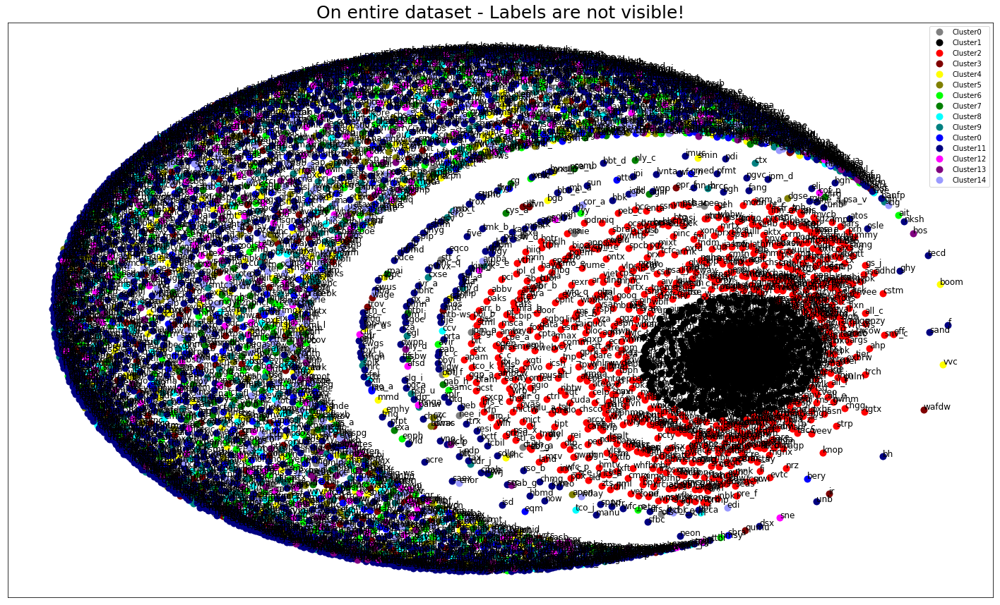

In [71]:
# set up plot
fig, ax = plt.subplots(figsize=(25, 15)) # set size
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling

# iterate through groups to layer the plot
# the cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
for name, group in groups:
    ax.plot(group.x, group.y, marker='o', linestyle='', ms=10, 
            label=cluster_names[name], color=cluster_colors[name], 
            mec='none')
    ax.set_aspect('auto')
    ax.tick_params(\
        axis= 'x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelbottom='off')
    ax.tick_params(\
        axis= 'y',         # changes apply to the y-axis
        which='both',      # both major and minor ticks are affected
        left='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelleft='off')
    
ax.legend(numpoints=1)  # show legend with only 1 point
plt.title("On entire dataset - Labels are not visible!", size=25)

#add label in x,y position with the label as the ticker symbol
for i in range(len(df)):
    ax.text(df.loc[i]['x'], df.loc[i]['y'], df.loc[i]['ticker'], size=12)  

plt.show() #show the plot

#### On subset of data

In [72]:
# now lets sample only 1000 tickers to plot
df = df.sample(n=1000, replace=False)

In [73]:
# reset the index
df = df.reset_index(drop=True)

In [74]:
# view number of tickers in each cluster
df.groupby('label').count()

,ticker,x,y
label,,,
0,10,10,10
1,208,208,208
2,117,117,117
3,34,34,34
4,29,29,29
5,29,29,29
6,31,31,31
7,24,24,24
8,37,37,37


In [75]:
# group by cluster
groups = df.groupby('label')

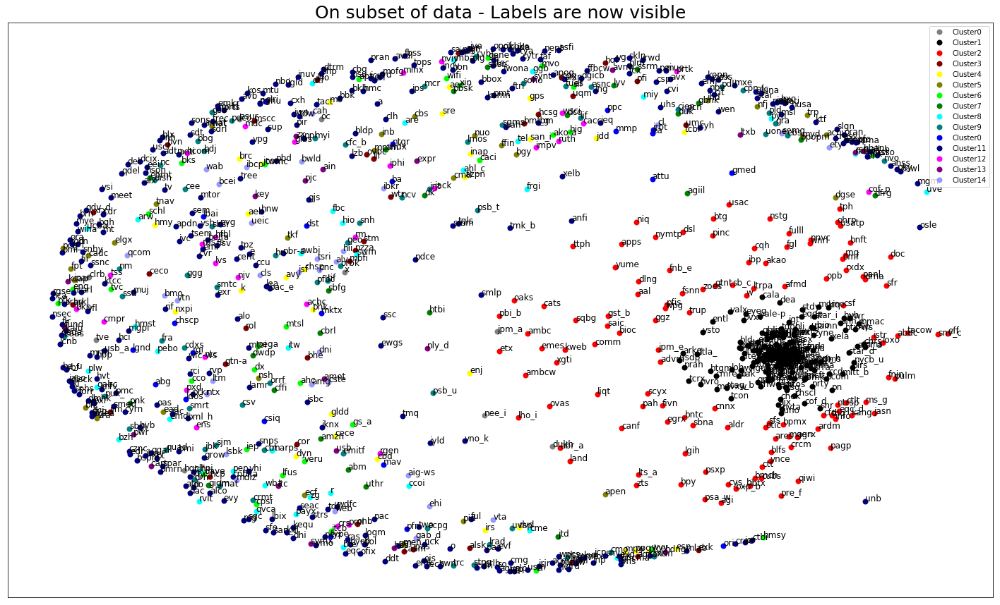

In [76]:
# set up plot
fig, ax = plt.subplots(figsize=(25, 15)) # set size
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling

# iterate through groups to layer the plot
# the cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
for name, group in groups:
    ax.plot(group.x, group.y, marker='o', linestyle='', ms=8, 
            label=cluster_names[name], color=cluster_colors[name], 
            mec='none')
    ax.set_aspect('auto')
    ax.tick_params(\
        axis= 'x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelbottom='off')
    ax.tick_params(\
        axis= 'y',         # changes apply to the y-axis
        which='both',      # both major and minor ticks are affected
        left='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelleft='off')
    
ax.legend(numpoints=1)  # show legend with only 1 point
plt.title("On subset of data - Labels are now visible", size=25)

#add label in x,y position with the label as the ticker symbol
for i in range(len(df)):
    ax.text(df.loc[i]['x'], df.loc[i]['y'], df.loc[i]['ticker'], size=12)  

plt.show() #show the plot

In [24]:
# defining a function to plot the clusters for later use
def visualize_clusters (xs, ys, clusters, df):

    # set up colors per clusters using a dict
    cluster_colors = {0: '#808080', 1: '#000000', 2: '#FF0000', 3: '#800000', 4: '#FFFF00',
                      5: '#808000', 6: '#00FF00', 7: '#008000', 8: '#00FFFF', 9: '#008080',
                      10: '#0000FF', 11: '#000080', 12: '#FF00FF', 13: '#800080', 14: '#9999ff'}

    # set up cluster names using a dict
    cluster_names = {0: 'Cluster0', 1: 'Cluster1', 2: 'Cluster2', 3: 'Cluster3', 4: 'Cluster4',
                     5: 'Cluster5', 6: 'Cluster6', 7: 'Cluster7', 8: 'Cluster8', 9: 'Cluster9',
                     10: 'Cluster0', 11: 'Cluster11', 12: 'Cluster12', 13: 'Cluster13', 14: 'Cluster14'}

    #group by cluster
    groups = df.groupby('label')

    # set up plot
    fig, ax = plt.subplots(figsize=(25, 15)) # set size
    ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling

    # iterate through groups to layer the plot
    # cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
    for name, group in groups:
        ax.plot(group.x, group.y, marker='o', linestyle='', ms=10, 
                label=cluster_names[name], color=cluster_colors[name], 
                mec='none')
        ax.set_aspect('auto')
        ax.tick_params(\
            axis= 'x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom='off',      # ticks along the bottom edge are off
            top='off',         # ticks along the top edge are off
            labelbottom='off')
        ax.tick_params(\
            axis= 'y',         # changes apply to the y-axis
            which='both',      # both major and minor ticks are affected
            left='off',      # ticks along the bottom edge are off
            top='off',         # ticks along the top edge are off
            labelleft='off')

    ax.legend(numpoints=1)  # show legend with only 1 point
    plt.title("On entire dataset - Labels are not visible!", size=25)

    #add label in x,y position with the label as the ticker symbol
    for i in range(len(df)):
        ax.text(df.loc[i]['x'], df.loc[i]['y'], df.loc[i]['ticker'], size=12)  

    plt.show() #show the plot

### Step 9: Tuning the model

- Window size: sliding window length to define the number of words
- Stride size: stride of sliding
- Number of Bin’s: number of bins in each sliding window
- Alphabets: alphabet for symbolization

In [27]:
# generate the list of sax symbols for each ticker
sax = pysax.SAXModel(window=35, stride = 35, nbins = 10, alphabet="ABCDE")
df_stocks_sax_symb=pd.DataFrame()
for ticker in df_stocks.columns:
    df_stocks_sax_symb[ticker] = sax.symbolize_signal(df_stocks_norm[ticker])
    
# transpose the dataframe to make tickers as rows
df_stocks_sax_symb = df_stocks_sax_symb.T

# generate sax bag of words representation for each ticker
df_stocks_sax_bow=pd.DataFrame()
stocks_sax_bow = [' '.join(row) for row in df_stocks_sax_symb[df_stocks_sax_symb.columns[0:]].values]
df_stocks_sax_bow['sax_bow'] = [' '.join(row) for row in df_stocks_sax_symb[df_stocks_sax_symb.columns[0:]].values]

df_stocks_sax_bow.index = df_stocks_sax_symb.index

df_stocks_sax_bow.head()

,sax_bow
a,AAABCDDEED AABADECEDD EEDCEDAAAB EBDCECBCBA BB...
aa,AABBDDDEDD DECABEDCCA DEDDECBAAA DABBECBEDA BA...
aaap,CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CC...
aaba,EBBDCBCDEA BBBAACEEED AADDECCCCC BABBCCCEEE DD...
aac,CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CC...


In [28]:
df_stocks_sax_bow['sax_bow'].loc['aapl']

'AAABBCDDEE AABABDDEEE EDDDDCBAAB BABBCBBDEE BBABBCDEEE DCDEECCAAA EEDBAABDDA EDDCDDDBBA DCEEDCBAAA EEDCCCAABD EEBCDDDBBA AABBCCCEEE CEEDCDBABC AAABDEDDDE AACDDDCEDC DCEEBAACDC ABCDBDEECA AABCDCDDEE ACBBABDEED ACBABCEEED BDDCCBCBAE AAABDEEDDC BDDCACBADE AACDEEDCBD BABCCCEEDC ADEEDCBBBB DDCDEDCAAA EACBBDEDDB AAABCEEDBD EEEECBBBAA EDECBBACCC AAACCCDEDE EEBBAABCDC EDCBABBCEE ABCDEEDCDC ACBBBCEEED CBAACCBBEE'

In [29]:
# convert in TF-IDF vectors
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(stocks_sax_bow)

In [30]:
# perform clustering
num_clusters = 15

km = KMeans(n_clusters=num_clusters)

km.fit(tfidf_matrix)

clusters = km.labels_.tolist()

stocks = { 'ticker': df_stocks.columns, 'cluster': clusters }

df_cluster = pd.DataFrame(stocks, index = [clusters] , columns = ['ticker', 'cluster'])

# cluster value counts
df_cluster['cluster'].value_counts()

2     1501
5      785
7      606
9      585
14     453
13     330
6      313
4      284
8      280
10     278
3      273
11     246
0      243
12     173
1       49
Name: cluster, dtype: int64

In [31]:
km.inertia_

4992.941584988365

In [22]:
# apply MDS 
dist = 1 - cosine_similarity(tfidf_matrix)

MDS()

mds = MDS(n_components=2, dissimilarity="precomputed", random_state=1)

%time pos = mds.fit_transform(dist) 

xs, ys = pos[:, 0], pos[:, 1]

Wall time: 30min 7s


In [27]:
# create data frame that has the result of the MDS plus the cluster numbers and tickers
df = pd.DataFrame(dict(x=xs, y=ys, label=clusters, ticker=df_stocks.columns)) 

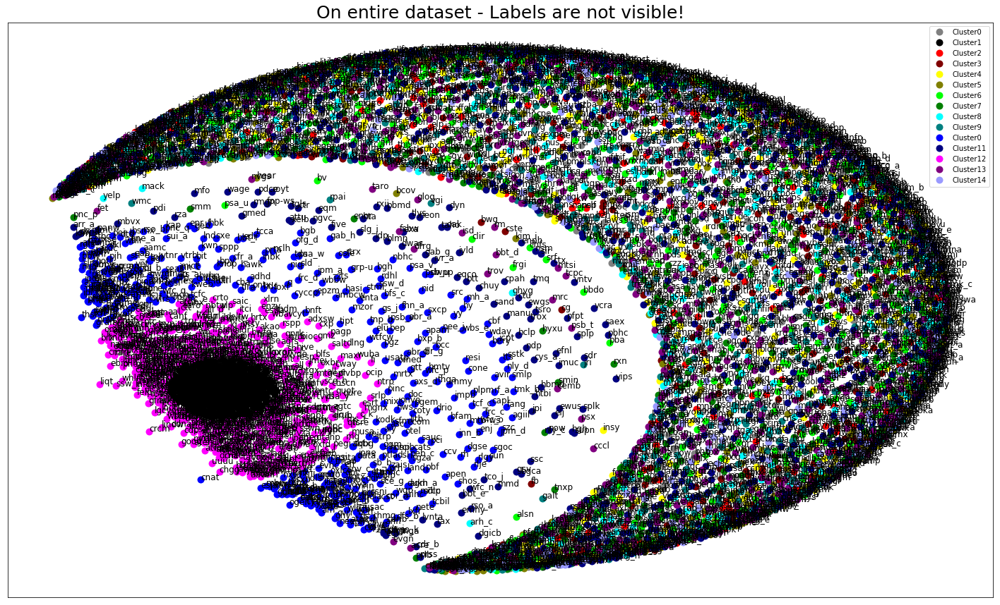

In [29]:
visualize_clusters (xs, ys, clusters, df)

In [26]:
# sample only 1000 tickers
df = df.sample(n=1000, replace=False)
df = df.reset_index(drop=True)

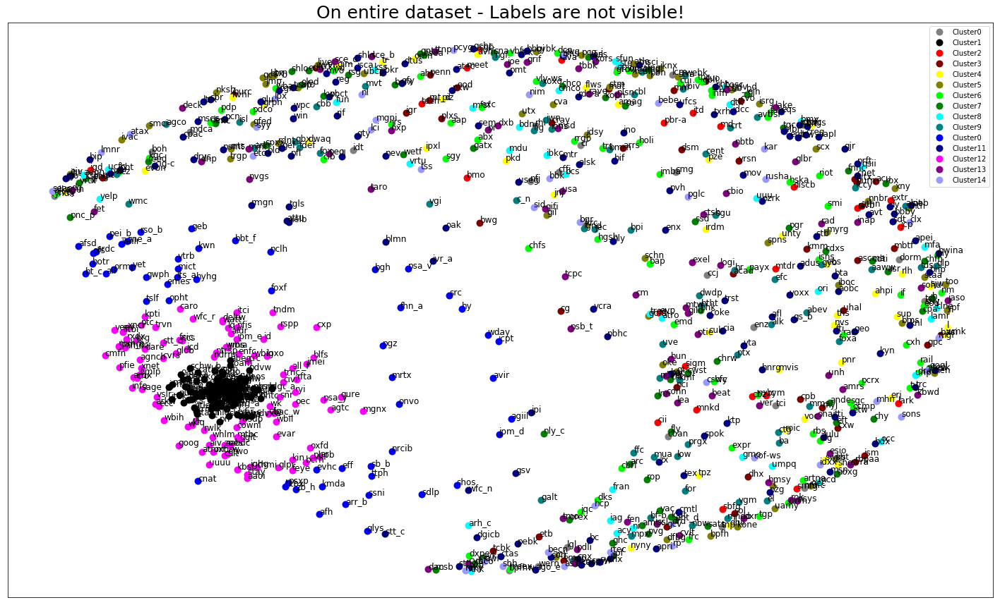

In [33]:
visualize_clusters (xs, ys, clusters, df)

In [22]:
# generate the list of sax symbols for each ticker
sax = pysax.SAXModel(window=10, stride = 10, nbins = 10, alphabet="ABCDE")
df_stocks_sax_symb=pd.DataFrame()
for ticker in df_stocks.columns:
    df_stocks_sax_symb[ticker] = sax.symbolize_signal(df_stocks_norm[ticker])
    
# transpose the dataframe to make tickers as rows
df_stocks_sax_symb = df_stocks_sax_symb.T

# generate sax bag of words representation for each ticker
df_stocks_sax_bow=pd.DataFrame()
stocks_sax_bow = [' '.join(row) for row in df_stocks_sax_symb[df_stocks_sax_symb.columns[0:]].values]
df_stocks_sax_bow['sax_bow'] = [' '.join(row) for row in df_stocks_sax_symb[df_stocks_sax_symb.columns[0:]].values]

df_stocks_sax_bow.index = df_stocks_sax_symb.index

df_stocks_sax_bow.head()

,sax_bow
a,AAABBDEEEE AACCBBDEDD AACBEDDEEC EEDEBBAACB BC...
aa,AACBACCDEE AABCCDDEDE BAABEEDDDB DBACAAEDEE EE...
aaap,CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CC...
aaba,EECCBABBCB AAEEECCBAC AABBDCCCEE EDCDCCBABB EE...
aac,CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CCCCCCCCCC CC...


In [23]:
df_stocks_sax_bow['sax_bow'].loc['aapl']

'AAACEDEEDD ABCBABAEEE ABBABBCDEE BCABBBEDEE ABDEEBAADE AACCCDEEDD ABCBACEDEE EEEDCACCAA BAEEECCCCA EDEEDCCBAA BADCBBDEEB AACCECECCD EEECDAABAD ABBEDEDCBC DDDEDDCAAA ABABCEDDEE AAAACEDEEE DDDAAADBDE AAABDDEEDD EDBECABCCA DCDBBCEECA EDDDCCCBBA EEDBCBBBAA BAAABEDDEE EECCBBCCBA CEEDCCCABA DDEECBBABA DCDDDDDEAA ACCBBACCEE EDDDCCCAAA EEEDBABABB BAAACEDDDE EEECCBBBAA DDEEDCDAAA AAAABDEDEE EDEDDDBAAA BAABCCBCEE EEDCDCBABA EEEDCBBAAA ABCCBADCEE BCCCABAEEE AAABDEEEDB ABCCDEDDDD EABBBBAEDE EECCBAABCB EEACBADEBB BAABCCDDEE BACEDEACDA DDCACBBCEE BBABBBDEEE AEDEBEDCBA CBAAAEEEDC DEEDBBBBAA ACEEAACDEB EBBBBBCCCD ACCEEEECAA CAACBCEEDD CEECAACCBD CECBBBDECA CCECABAADD AAACCEEDDE ECBAADDDBE AAAACCDDEE AACCCEEECB EEEDBBAABE AAABBEEEDD DCBABABEEE EEEBCBBAAB AABBBCEEEE CCDDDDEAAA AACDDDCDDC DEEADCDABB DCEEEDCAAA AABCCCDEDE BABBBBCDEE AAABBEDEEE DDEEDBDAAA AABDDDDDDE EECCBAAADD CDDAAACCEE AABDCDDDED AABCDDDEDE EEBDBCCBAA EBAAACDEEC EEABAEBBCC EBADEDCDCA BACDDEDCAC EAAADCBBEE BAADEEAEDB EEEDCAACCA ADCEADBED

In [24]:
# convert in TF-IDF vectors
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(stocks_sax_bow)

In [25]:
# perform clustering
num_clusters = 15

km = KMeans(n_clusters=num_clusters)

km.fit(tfidf_matrix)

clusters = km.labels_.tolist()

stocks = { 'ticker': df_stocks.columns, 'cluster': clusters }

df_cluster = pd.DataFrame(stocks, index = [clusters] , columns = ['ticker', 'cluster'])

# cluster value counts
df_cluster['cluster'].value_counts()

9     1706
6      831
11     500
14     407
2      401
10     347
12     314
3      306
13     278
5      275
7      232
1      219
8      214
4      205
0      164
Name: cluster, dtype: int64

In [26]:
km.inertia_

4611.363259780901

In [38]:
# apply MDS 
dist = 1 - cosine_similarity(tfidf_matrix)

MDS()

mds = MDS(n_components=2, dissimilarity="precomputed", random_state=1)

%time pos = mds.fit_transform(dist) 

xs, ys = pos[:, 0], pos[:, 1]

Wall time: 29min 12s


In [39]:
# create data frame that has the result of the MDS plus the cluster numbers and tickers
df = pd.DataFrame(dict(x=xs, y=ys, label=clusters, ticker=df_stocks.columns)) 

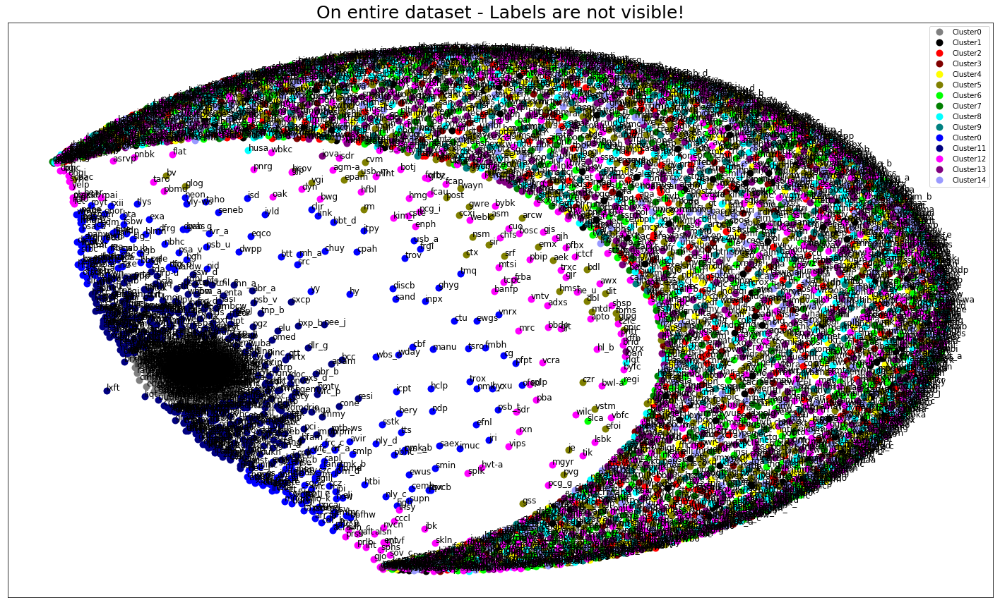

In [40]:
visualize_clusters (xs, ys, clusters, df)

In [41]:
df = df.sample(n=1000, replace=False)
df = df.reset_index(drop=True)

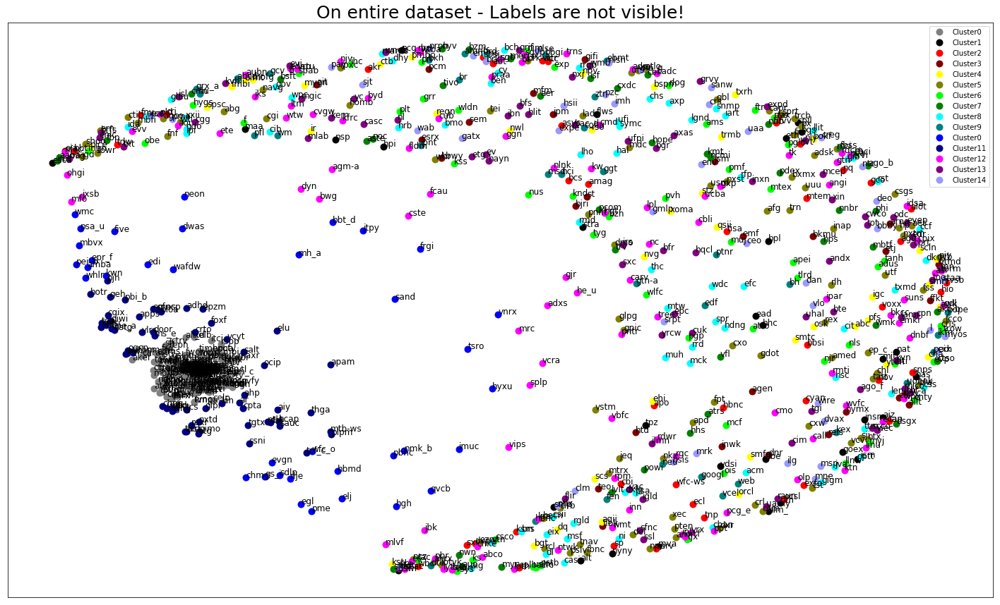

In [42]:
visualize_clusters (xs, ys, clusters, df)

In [17]:
# generate the list of sax symbols for each ticker
sax = pysax.SAXModel(window=35, stride=35, nbins = 20, alphabet="ABCDE")
df_stocks_sax_symb=pd.DataFrame()
for ticker in df_stocks.columns:
    df_stocks_sax_symb[ticker] = sax.symbolize_signal(df_stocks_norm[ticker])
    
# transpose the dataframe to make tickers as rows
df_stocks_sax_symb = df_stocks_sax_symb.T

# generate sax bag of words representation for each ticker
df_stocks_sax_bow=pd.DataFrame()
stocks_sax_bow = [' '.join(row) for row in df_stocks_sax_symb[df_stocks_sax_symb.columns[0:]].values]
df_stocks_sax_bow['sax_bow'] = [' '.join(row) for row in df_stocks_sax_symb[df_stocks_sax_symb.columns[0:]].values]

df_stocks_sax_bow.index = df_stocks_sax_symb.index

df_stocks_sax_bow.head()

,sax_bow
a,AAAAAABCCDDDDEEEEDDD AAABBBABCDEEDCDEDDCE EEEE...
aa,AAAABBBCDDDDCEEEEDCD DEEDDCAAADEEECCBBCAA CEEE...
aaap,CCCCCCCCCCCCCCCCCCCC CCCCCCCCCCCCCCCCCCCC CCCC...
aaba,EDBBBBBEDCBCBDDDEDAA BABBBBAAAABDEEEEDEDC AAAA...
aac,CCCCCCCCCCCCCCCCCCCC CCCCCCCCCCCCCCCCCCCC CCCC...


In [18]:
df_stocks_sax_bow['sax_bow'].loc['aapl']

'AAABBABBBBCCDDDDEEEE AAAABBAABCDDDDDEDEEE EEEDDCBEDCCBBBBAAABB ABAABBBBCDCBBBDEEEEE BBBAAABBBBCCCDEEEEEE CDDCDEEEEDDCCCAAAAAA EEEEDCCAAAAABBDDDDBA EECDDCCCCEEDDDBBBBBA CDCCEEEEDDCCCBAAAAAB EEEEDDCCBCCBBAAAACDD EEEDABCCDCDDDCCBBAAA AAABBBBBCCCBCDDEEEEE BDEEEEDDCDDEBAAAACCC AAAAAABBCDEEDDDDDDDE AAAABCDEDEDDCCDEDDDB DDCDEDDEDAAAAACDDDDC AABCCCDDACCDEEEEDABA AAAAACCCDDCCDDDDDEEE ABBDCBBBAAABDDEEEEED ABBCBAAAABCCEEEEEEDC ACDDDDDBCCBBBCBAACEE AAAAAABCDDDEEEEDDCCB ABDDDEDCAACCCAABDDEE AAAACDDDEEEDDCCBBCDC CAABABCBCCBCDEEECDBC AACDEEEEEDDBBBABBBBA DDDDBCDEEEDCCCBAAAAA EDAABDBCBCCDEDDDECBB AAAAAABBDCEEEEEDBBDE EEEEDEEDDCBBBBBBAAAA EEDCCEEACBCABAADCCCD AAAAAABCCCCCDEEEDEEE EEEEBABBAAAABBCDDDDC EEECCBBBAABBABCCEEEE AABBBDDDDEEDDDCCCDDB ABCBCBBBBBBDEEEEEEDC DCBCBAABCCCDCBBCDEEE'

In [19]:
# convert in TF-IDF vectors
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(stocks_sax_bow)

In [20]:
# perform clustering
num_clusters = 15

km = KMeans(n_clusters=num_clusters)

km.fit(tfidf_matrix)

clusters = km.labels_.tolist()

stocks = { 'ticker': df_stocks.columns, 'cluster': clusters }

df_cluster = pd.DataFrame(stocks, index = [clusters] , columns = ['ticker', 'cluster'])

# cluster value counts
df_cluster['cluster'].value_counts()

1     3620
2     1438
10     667
0      469
14      43
9       27
11      23
13      20
3       18
6       17
7       13
4       13
12      11
5       10
8       10
Name: cluster, dtype: int64

In [21]:
km.inertia_

5077.802970465394

In [21]:
# apply MDS 
dist = 1 - cosine_similarity(tfidf_matrix)

MDS()

mds = MDS(n_components=2, dissimilarity="precomputed", random_state=1)

%time pos = mds.fit_transform(dist) 

xs, ys = pos[:, 0], pos[:, 1]

Wall time: 29min 30s


In [29]:
# create data frame that has the result of the MDS plus the cluster numbers and tickers
df = pd.DataFrame(dict(x=xs, y=ys, label=clusters, ticker=df_stocks.columns)) 

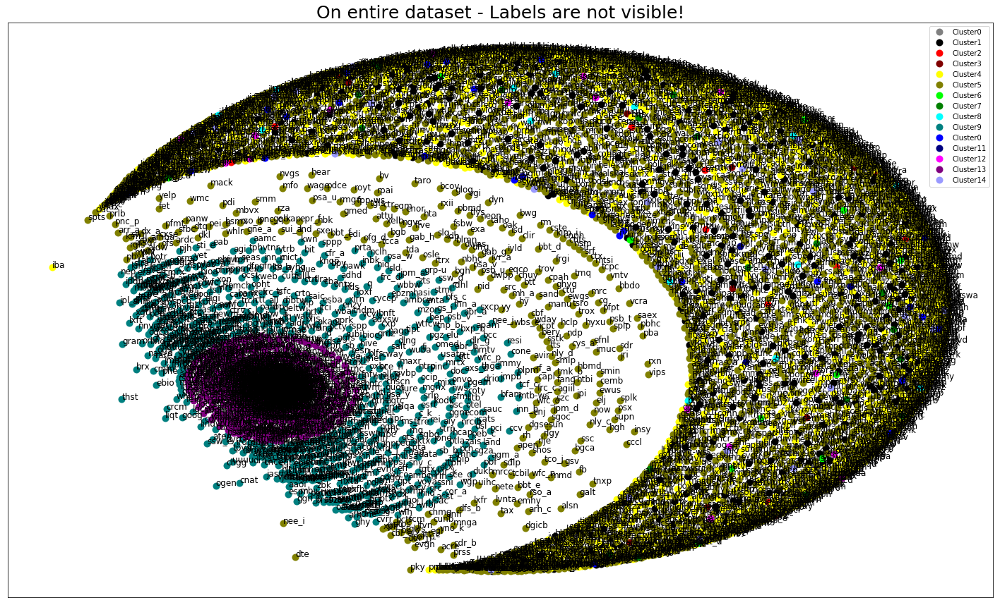

In [30]:
visualize_clusters (xs, ys, clusters, df)

In [31]:
# sample only 1000 tickers
df = df.sample(n=1000, replace=False)
df = df.reset_index(drop=True)

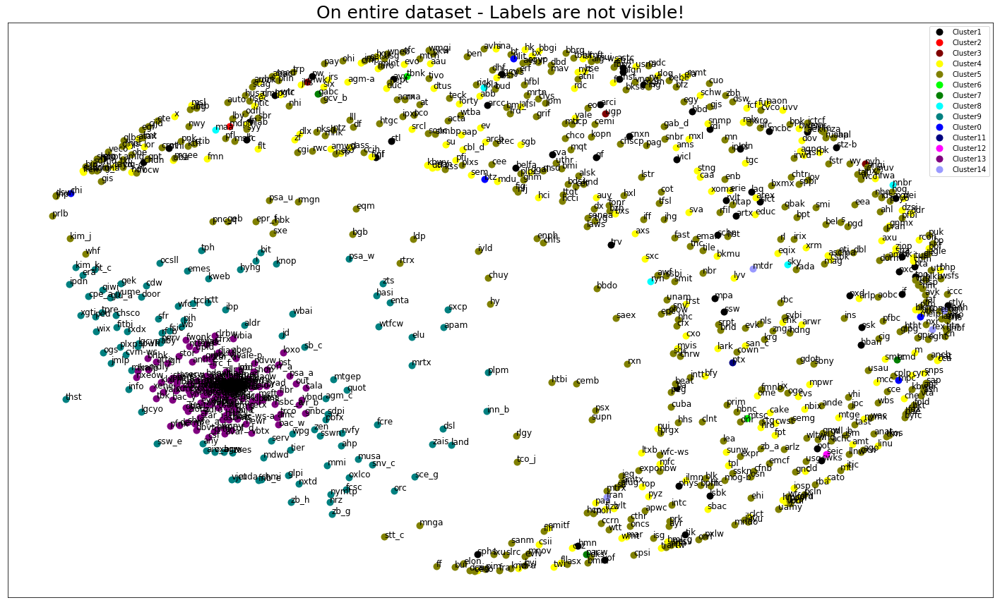

In [32]:
visualize_clusters (xs, ys, clusters, df)

### Comparing SAX and DTW methods:

In [72]:
# load the same stock data that was used for DTW in the other notebook for comparison
df_stocks_comp = pd.read_csv('stocks_2017_500.csv', index_col=0)

In [157]:
df_stocks_comp.shape

(500, 223)

In [58]:
df_stocks_comp.head()

,2017-01-03,2017-01-04,2017-01-05,2017-01-06,2017-01-09,2017-01-10,2017-01-11,2017-01-12,2017-01-13,2017-01-17,...,2017-10-30,2017-10-31,2017-11-01,2017-11-02,2017-11-03,2017-11-06,2017-11-07,2017-11-08,2017-11-09,2017-11-10
hae,39.600,39.890,39.410,39.630,39.960,40.460,40.070,40.030,40.450,39.510,...,47.110,47.560,46.640,46.52,47.12,46.830,51.510,54.22,54.92,54.52
dan,18.982,19.615,19.475,19.120,18.853,19.595,19.438,19.061,19.130,19.001,...,29.663,30.431,30.821,31.31,31.28,30.821,30.771,31.13,30.58,30.57
lnt,36.748,36.971,36.922,36.622,36.118,36.079,36.573,36.476,36.320,36.573,...,43.180,43.260,43.070,43.06,43.83,43.590,44.170,44.07,44.10,43.68
awr,44.236,44.906,44.059,43.508,42.603,42.771,43.193,42.494,42.967,42.455,...,53.740,53.750,53.620,54.11,53.80,53.990,53.440,53.95,53.67,52.94
feng,3.210,3.380,3.350,3.150,3.230,3.275,3.300,3.230,3.390,3.360,...,5.670,5.440,5.370,5.27,5.27,5.340,5.640,5.35,5.38,5.46


In [59]:
df_stocks_comp_T = df_stocks_comp.T

In [60]:
df_stocks_comp_T.head()

,hae,dan,lnt,awr,feng,bsmx,muj,cez,hrzn,acn,...,msi,trxc,ubrt,sji,mksi,cpla,intc,mvf,etj,agn_a
2017-01-03,39.60,18.982,36.748,44.236,3.21,7.1510,13.353,24.036,9.657,114.15,...,82.215,1.42,110.37,32.862,59.440,85.419,35.598,9.2159,8.2805,783.352
2017-01-04,39.89,19.615,36.971,44.906,3.38,7.2296,13.389,24.381,10.188,114.43,...,82.108,1.44,110.37,33.419,60.084,86.403,35.422,9.2548,8.3540,779.590
2017-01-05,39.41,19.475,36.922,44.059,3.35,7.3769,13.467,24.705,10.107,112.72,...,81.272,1.44,110.37,33.018,59.538,84.878,35.355,9.2837,8.3447,793.530
2017-01-06,39.63,19.120,36.622,43.508,3.15,7.1510,13.437,24.556,10.134,114.01,...,81.517,1.50,110.37,32.608,59.637,84.631,35.481,9.2548,8.4273,789.260
2017-01-09,39.96,18.853,36.118,42.603,3.23,6.9742,13.496,24.556,10.188,112.73,...,81.645,1.47,110.37,31.162,60.284,84.385,35.607,9.3597,8.3814,791.860


In [61]:
# normalizing the tickers
sax = pysax.SAXModel() 
df_stocks_norm = pd.DataFrame(index=df_stocks_comp_T.index)
for ticker in df_stocks_comp_T.columns:
    df_stocks_norm[ticker] = sax.whiten(df_stocks_comp_T[ticker])

In [159]:
df_stocks_norm.shape

(223, 500)

In [62]:
df_stocks_norm.head()

,hae,dan,lnt,awr,feng,bsmx,muj,cez,hrzn,acn,...,msi,trxc,ubrt,sji,mksi,cpla,intc,mvf,etj,agn_a
2017-01-03,-0.642865,-0.905262,-1.493626,-0.754969,-0.582298,-1.577402,-1.979154,-2.445662,-2.519464,-1.235160,...,-0.640852,0.350487,-0.212622,-0.915629,-1.503795,0.685638,-0.211325,-1.953537,-2.544228,-0.461720
2017-01-04,-0.542963,-0.732900,-1.389260,-0.573949,-0.424456,-1.509245,-1.888601,-2.207123,-1.158601,-1.201858,...,-0.668663,0.380431,-0.212622,-0.565630,-1.451281,0.798316,-0.276708,-1.720488,-2.269956,-0.520968
2017-01-05,-0.708318,-0.771021,-1.412192,-0.802790,-0.452311,-1.381516,-1.692404,-1.983104,-1.366190,-1.405239,...,-0.885947,0.380431,-0.212622,-0.817604,-1.495804,0.623689,-0.301598,-1.547348,-2.304660,-0.301424
2017-01-06,-0.632530,-0.867686,-1.552595,-0.951659,-0.638006,-1.577402,-1.767864,-2.086125,-1.296994,-1.251811,...,-0.822269,0.470260,-0.212622,-1.075233,-1.487731,0.595405,-0.254790,-1.720488,-1.996430,-0.368674
2017-01-09,-0.518849,-0.940388,-1.788472,-1.196171,-0.563728,-1.730712,-1.619458,-2.086125,-1.158601,-1.404049,...,-0.789001,0.425345,-0.212622,-1.983849,-1.434972,0.567235,-0.207982,-1.092032,-2.167710,-0.327726


In [63]:
df_stocks_comp.index

Index(['hae', 'dan', 'lnt', 'awr', 'feng', 'bsmx', 'muj', 'cez', 'hrzn', 'acn',
       ...
       'msi', 'trxc', 'ubrt', 'sji', 'mksi', 'cpla', 'intc', 'mvf', 'etj',
       'agn_a'],
      dtype='object', length=500)

In [177]:
# generate the list of sax symbols for each ticker
sax = pysax.SAXModel(window=4, stride = 2, nbins = 10, alphabet="ABCD")
df_stocks_sax_symb=pd.DataFrame()
for ticker in df_stocks_comp.index:
    df_stocks_sax_symb[ticker] = sax.symbolize_signal(df_stocks_norm[ticker])

# transpose the dataframe to make tickers as rows
df_stocks_sax_symb = df_stocks_sax_symb.T

# generate sax bag of words representation for each ticker
df_stocks_sax_bow=pd.DataFrame()
stocks_sax_bow = [' '.join(row) for row in df_stocks_sax_symb[df_stocks_sax_symb.columns[0:]].values]
df_stocks_sax_bow['sax_bow'] = [' '.join(row) for row in df_stocks_sax_symb[df_stocks_sax_symb.columns[0:]].values]

df_stocks_sax_bow.index = df_stocks_sax_symb.index

df_stocks_sax_bow.head()

,sax_bow
hae,BADAB AAABD AADAA CCADA DDAAD AACDA DDDAB AADA...
dan,AADDA DDDAD AADDA DDACA BCADD DDDAA AAADD BADD...
lnt,BADDA DDDAA AAADD DDDAD BADDA DDADA DDDAA BBAA...
awr,CBDCA DDDAA BAADA DDADA DDDBA DDABD AAACD AADD...
feng,BADDA DDAAD AAADA BCADD DDDAD AAADD BBDAD AAAD...


In [178]:
df_stocks_sax_bow['sax_bow'].loc['feng']

'BADDA DDAAD AAADA BCADD DDDAD AAADD BBDAD AAADA DDDAA DDDAA AAADC CDAAD AADBD BAADA DDAAA AAADD AAADD DDDAD BADDA DDADA DDCDA DDDAA AADAD BADDA DDDAA DDDDA DDDAA AAADD AADAD CBDCA DDABA DDCDA BCACD AABAD AADAC AABAD BADAA AAADB DDDAA AAADB DDDDA DDCAA DDDDA CDAAD AAADD DDDAA DDDAA DDDAA BADDA DDCAA DDDAA DDDAA ABADD BBADC DDDCA DDCAA DDDAA DDDDA DDCDA DDADA DDADD DDCDA DDDAA AAADD DDDAA DDDBA CDAAD AAADD DDDAA AAADD AAACD BBADA DDABA DDDAA CCDAA AAAAD AAADD DDDAA AAAAD AAADD AAADB BCAAD AADDA DDDAD AADDA DDCAA AAADD DDADA DDDAB AAAAD AADCD AAADD AAADA DDDAA CADAA AAADD BCADA DDBAA AAADD BBADB DDAAC CBDAA CCDAD BADAD CCDAA CDADD DDDAA DDDAA AAAAD AADAA'

In [179]:
# convert in TF-IDF vectors
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(stocks_sax_bow)

In [180]:
# perform k-means clustering with k=3 and 5
for k in (3,5):
    num_clusters = k

    km = KMeans(n_clusters=num_clusters)

    km.fit(tfidf_matrix)

    clusters = km.labels_.tolist()

    stocks = { 'ticker': df_stocks_comp.index, 'cluster': clusters }

    df_cluster = pd.DataFrame(stocks, index = [clusters] , columns = ['ticker', 'cluster'])

    print ("\nK-Means Clustering ( K =",k,")")
    # cluster value counts
    print ("Cluster Value Counts:\n\n",df_cluster['cluster'].value_counts())
    
    # print inertia
    print ("Clustering Inertia:\n\n",km.inertia_)
    
    print ("===========================")


K-Means Clustering ( K = 3 )
Cluster Value Counts:

 2    223
0    208
1     69
Name: cluster, dtype: int64
Clustering Inertia:

 150.6063109617567

K-Means Clustering ( K = 5 )
Cluster Value Counts:

 2    169
0    151
4     89
1     63
3     28
Name: cluster, dtype: int64
Clustering Inertia:

 143.23097218219726
